In [1]:
# Upload kaggle.json first
from google.colab import files
files.upload()

# Setup Kaggle API
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Download CelebA dataset
!kaggle datasets download -d jessicali9530/celeba-dataset
!unzip -q celeba-dataset.zip -d celeba


Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/jessicali9530/celeba-dataset
License(s): other
100% 1.33G/1.33G [00:08<00:00, 217MB/s]
100% 1.33G/1.33G [00:08<00:00, 172MB/s]


### Setup

In [2]:
import pandas as pd
import numpy as np
import os
from PIL import Image
import tensorflow as tf

IMG_SIZE = 64
LATENT_DIM = 100
BATCH_SIZE = 64
EPOCHS = 100

### Filter Long Hair Images

In [ ]:

IMG_DIR = 'celeba/img_align_celeba/img_align_celeba'
ATTR_FILE = 'celeba/list_attr_celeba.csv'

# Load attribute labels
df = pd.read_csv(ATTR_FILE)
df.columns = df.columns.str.strip()
df['image_id'] = df['image_id'].str.strip()

# Use Wavy_Hair attribute: 1 for wavy, -1 for not wavy
wavy_df = df[df['Wavy_Hair'] == 1].sample(n=20000, random_state=42)
non_wavy_df = df[df['Wavy_Hair'] == -1].sample(n=20000, random_state=42)

# Combine and shuffle
mixed_df = pd.concat([wavy_df, non_wavy_df]).sample(frac=1, random_state=42).reset_index(drop=True)

# Store labels: 1 for wavy, 0 for not wavy
labels = (mixed_df['Wavy_Hair'] == 1).astype(np.float32).values.reshape(-1, 1)
image_ids = mixed_df['image_id'].tolist()

# Load and preprocess images
def load_images(image_ids):
    data = []
    for img_id in image_ids:
        path = os.path.join(IMG_DIR, img_id)
        img = Image.open(path).resize((IMG_SIZE, IMG_SIZE)).convert('RGB')
        img = (np.array(img) / 127.5) - 1.0 
        data.append(img)
    return np.array(data, dtype=np.float32)

images = load_images(image_ids)
conditions = labels  # 1 for Wavy Hair, 0 for Not


### Plot some Long Hair samples

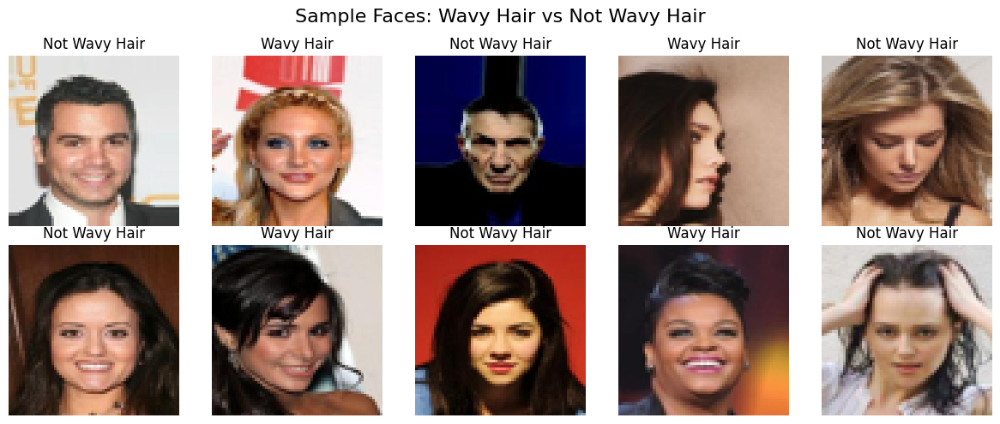

In [5]:
import matplotlib.pyplot as plt

# Pick 10 samples (first 10 or random)
sample_indices = np.arange(10)
sample_images = images[sample_indices]
sample_conditions = conditions[sample_indices]

plt.figure(figsize=(12, 5))
for i in range(10):
    plt.subplot(2, 5, i + 1)
    img = (sample_images[i] + 1) / 2.0  # Rescale to [0, 1]
    plt.imshow(img)
    label = "Wavy Hair" if sample_conditions[i][0] == 1.0 else "Not Wavy Hair"
    plt.title(label)
    plt.axis('off')

plt.suptitle("Sample Faces: Wavy Hair vs Not Wavy Hair", fontsize=16)
plt.tight_layout()
plt.show()


### Build Conditional Generator & Discriminator

In [6]:
def make_generator():
    noise = tf.keras.Input(shape=(LATENT_DIM,))
    label = tf.keras.Input(shape=(1,))
    x = tf.keras.layers.Concatenate()([noise, label]) # (101, )
    x = tf.keras.layers.Dense(8 * 8 * 256, use_bias=False)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU()(x)
    x = tf.keras.layers.Reshape((8, 8, 256))(x)
    x = tf.keras.layers.Conv2DTranspose(128, 4, strides=2, padding='same', use_bias=False)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU()(x)
    x = tf.keras.layers.Conv2DTranspose(64, 4, strides=2, padding='same', use_bias=False)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU()(x)
    x = tf.keras.layers.Conv2DTranspose(3, 4, strides=2, padding='same', activation='tanh')(x)
    return tf.keras.Model([noise, label], x)

def make_discriminator():
    image = tf.keras.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
    label = tf.keras.Input(shape=(1,))
    label_embedding = tf.keras.layers.Dense(IMG_SIZE * IMG_SIZE)(label)
    label_embedding = tf.keras.layers.Reshape((IMG_SIZE, IMG_SIZE, 1))(label_embedding) #(64,64,1)
    x = tf.keras.layers.Concatenate()([image, label_embedding]) #(64,64,4)
    x = tf.keras.layers.Conv2D(64, 4, strides=2, padding='same')(x)
    x = tf.keras.layers.LeakyReLU()(x)
    x = tf.keras.layers.Conv2D(128, 4, strides=2, padding='same')(x)
    x = tf.keras.layers.LeakyReLU()(x)
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(1)(x)
    return tf.keras.Model([image, label], x)

generator = make_generator()
discriminator = make_discriminator()

generator.summary()
discriminator.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 100)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_1       │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 101)       │          0 │ input_layer[0][0… │
│ (Concatenate)       │                   │            │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 16384)     │  1,654,784 │ concatenate[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 16384)     │     65,536 │ dense[0][0]       │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu         │ (None, 16384)     │          0 │ batch_normalizat… │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape (Reshape)   │ (None, 8, 8, 256) │          0 │ leaky_re_lu[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose    │ (None, 16, 16,    │    524,288 │ reshape[0][0]     │
│ (Conv2DTranspose)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 16, 16,    │        512 │ conv2d_transpose… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_1       │ (None, 16, 16,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_1  │ (None, 32, 32,    │    131,072 │ leaky_re_lu_1[0]… │
│ (Conv2DTranspose)   │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        256 │ conv2d_transpose… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_2       │ (None, 32, 32,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_2  │ (None, 64, 64, 3) │      3,075 │ leaky_re_lu_2[0]… │
│ (Conv2DTranspose)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 2,379,523 (9.08 MB)

 Trainable params: 2,346,371 (8.95 MB)

 Non-trainable params: 33,152 (129.50 KB)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 4096)      │      8,192 │ input_layer_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_2       │ (None, 64, 64, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_1 (Reshape) │ (None, 64, 64, 1) │          0 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 64, 64, 4) │          0 │ input_layer_2[0]… │
│ (Concatenate)       │                   │            │ reshape_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 32, 32,    │      4,160 │ concatenate_1[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_3       │ (None, 32, 32,    │          0 │ conv2d[0][0]      │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 16, 16,    │    131,200 │ leaky_re_lu_3[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_4       │ (None, 16, 16,    │          0 │ conv2d_1[0][0]    │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten (Flatten)   │ (None, 32768)     │          0 │ leaky_re_lu_4[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 1)         │     32,769 │ flatten[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 176,321 (688.75 KB)

 Trainable params: 176,321 (688.75 KB)

 Non-trainable params: 0 (0.00 B)

### Define Loss, Optimizers, Train Step

In [7]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_output, fake_output):
    return cross_entropy(tf.ones_like(real_output), real_output) + cross_entropy(tf.zeros_like(fake_output), fake_output)

@tf.function
def train_step(images, labels):
    noise = tf.random.normal([tf.shape(images)[0], LATENT_DIM])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated = generator([noise, labels], training=True)
        real_output = discriminator([images, labels], training=True)
        fake_output = discriminator([generated, labels], training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gen_grad = gen_tape.gradient(gen_loss, generator.trainable_variables)
    disc_grad = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    generator_optimizer.apply_gradients(zip(gen_grad, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(disc_grad, discriminator.trainable_variables))

    return gen_loss, disc_loss


### Train the Conditional GAN

Epoch 1 - Generator Loss: 2.5408, Discriminator Loss: 0.5210


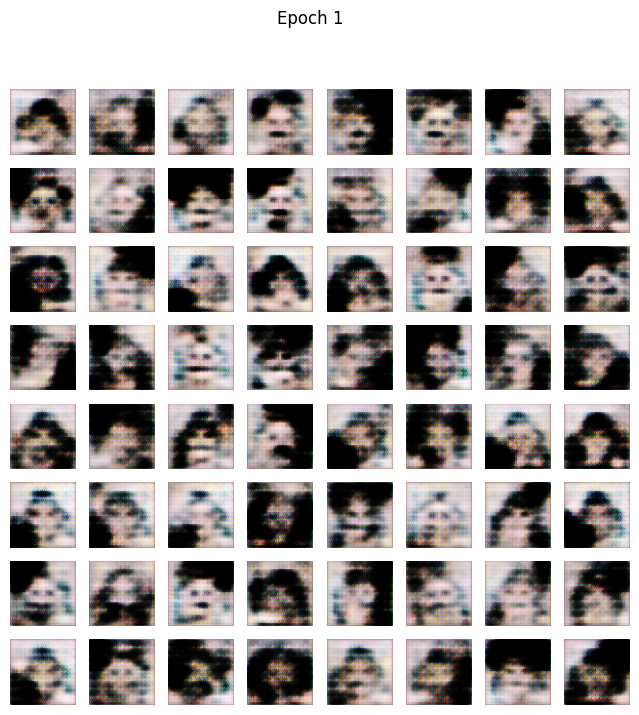

Epoch 2 - Generator Loss: 1.1643, Discriminator Loss: 1.0044
Epoch 3 - Generator Loss: 1.2493, Discriminator Loss: 0.9629
Epoch 4 - Generator Loss: 1.2369, Discriminator Loss: 1.0283
Epoch 5 - Generator Loss: 1.1664, Discriminator Loss: 1.0591


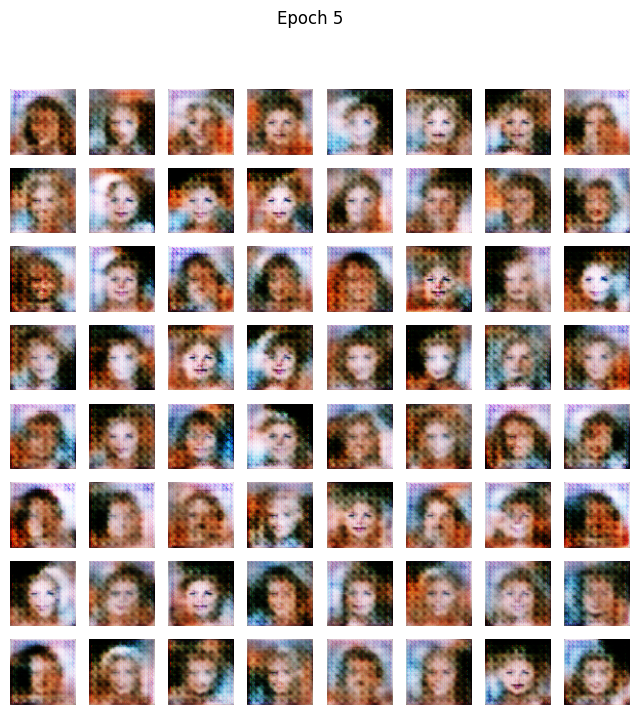

Epoch 6 - Generator Loss: 1.0660, Discriminator Loss: 1.0799
Epoch 7 - Generator Loss: 1.1199, Discriminator Loss: 1.0418
Epoch 8 - Generator Loss: 1.1952, Discriminator Loss: 1.0239
Epoch 9 - Generator Loss: 1.1518, Discriminator Loss: 1.0492
Epoch 10 - Generator Loss: 1.2321, Discriminator Loss: 0.9904


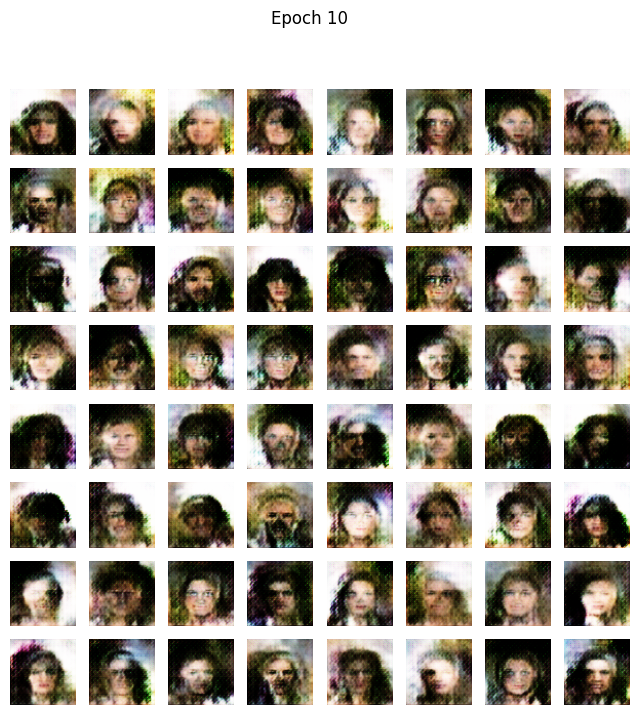

Epoch 11 - Generator Loss: 1.2116, Discriminator Loss: 1.0144
Epoch 12 - Generator Loss: 1.3324, Discriminator Loss: 1.0009
Epoch 13 - Generator Loss: 1.1502, Discriminator Loss: 1.0814
Epoch 14 - Generator Loss: 1.1955, Discriminator Loss: 1.0849
Epoch 15 - Generator Loss: 1.1518, Discriminator Loss: 1.0803


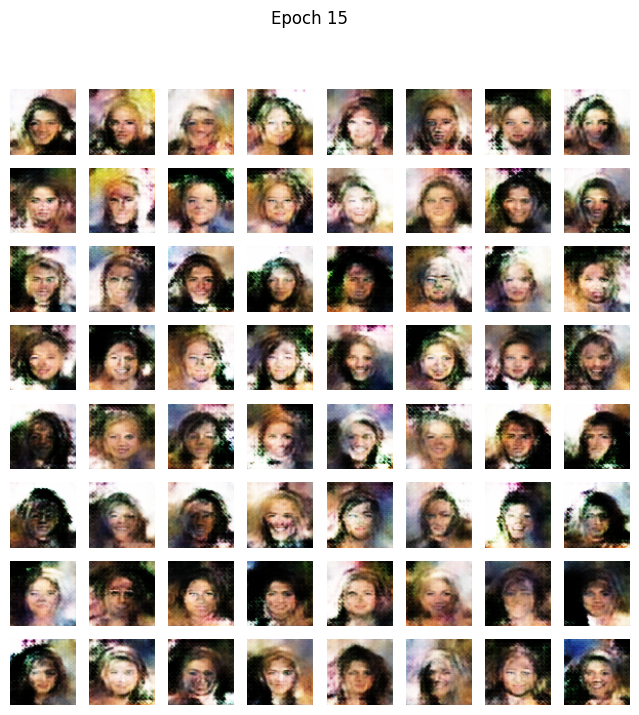

Epoch 16 - Generator Loss: 1.1219, Discriminator Loss: 1.0856
Epoch 17 - Generator Loss: 1.1344, Discriminator Loss: 1.0889
Epoch 18 - Generator Loss: 1.1175, Discriminator Loss: 1.1068
Epoch 19 - Generator Loss: 1.1688, Discriminator Loss: 1.0735
Epoch 20 - Generator Loss: 1.1184, Discriminator Loss: 1.1030


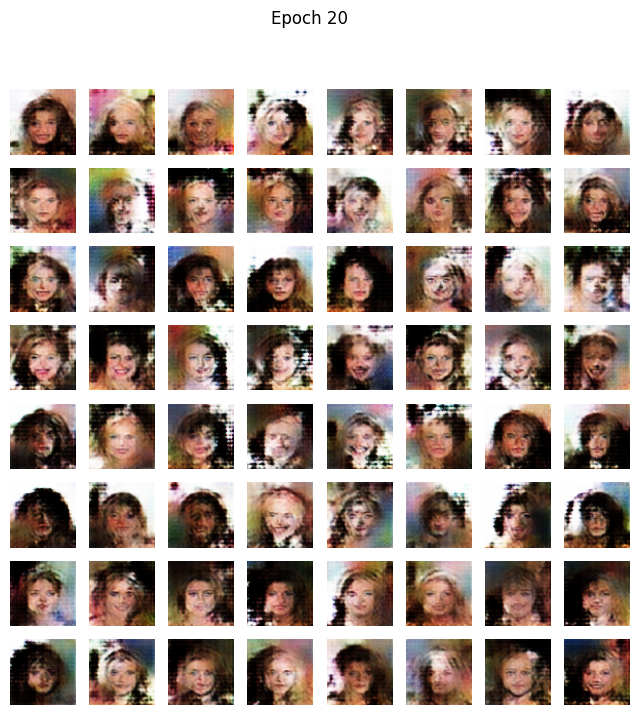

Epoch 21 - Generator Loss: 1.1266, Discriminator Loss: 1.0947
Epoch 22 - Generator Loss: 1.1288, Discriminator Loss: 1.0717
Epoch 23 - Generator Loss: 1.1590, Discriminator Loss: 1.0500
Epoch 24 - Generator Loss: 1.2009, Discriminator Loss: 1.0446
Epoch 25 - Generator Loss: 1.2218, Discriminator Loss: 1.0089


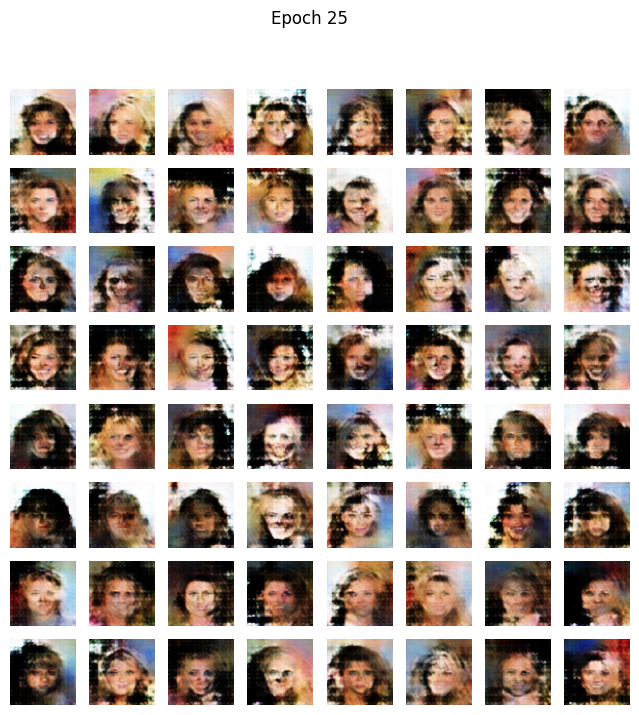

Epoch 26 - Generator Loss: 1.2511, Discriminator Loss: 0.9952
Epoch 27 - Generator Loss: 1.2106, Discriminator Loss: 1.0385
Epoch 28 - Generator Loss: 1.2567, Discriminator Loss: 0.9993
Epoch 29 - Generator Loss: 1.3003, Discriminator Loss: 0.9781
Epoch 30 - Generator Loss: 1.2895, Discriminator Loss: 0.9739


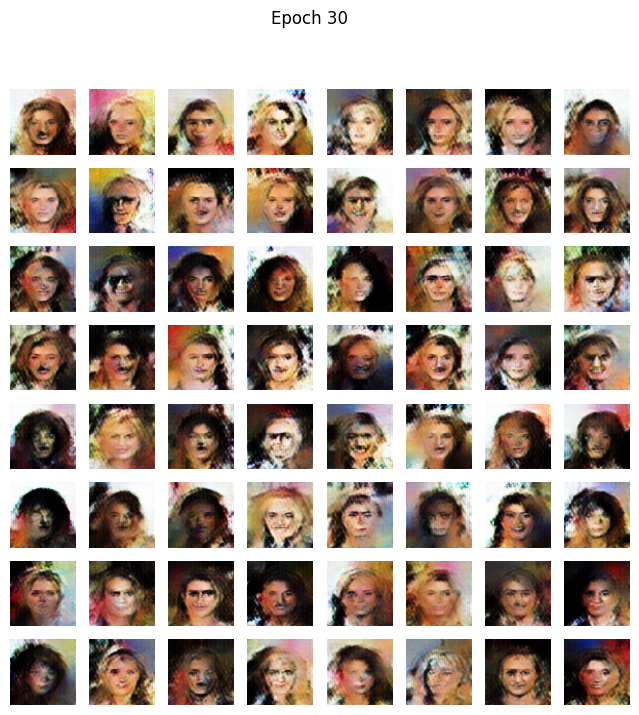

Epoch 31 - Generator Loss: 1.3017, Discriminator Loss: 0.9830
Epoch 32 - Generator Loss: 1.2766, Discriminator Loss: 0.9830
Epoch 33 - Generator Loss: 1.3075, Discriminator Loss: 0.9785
Epoch 34 - Generator Loss: 1.3215, Discriminator Loss: 0.9478
Epoch 35 - Generator Loss: 1.3002, Discriminator Loss: 0.9652


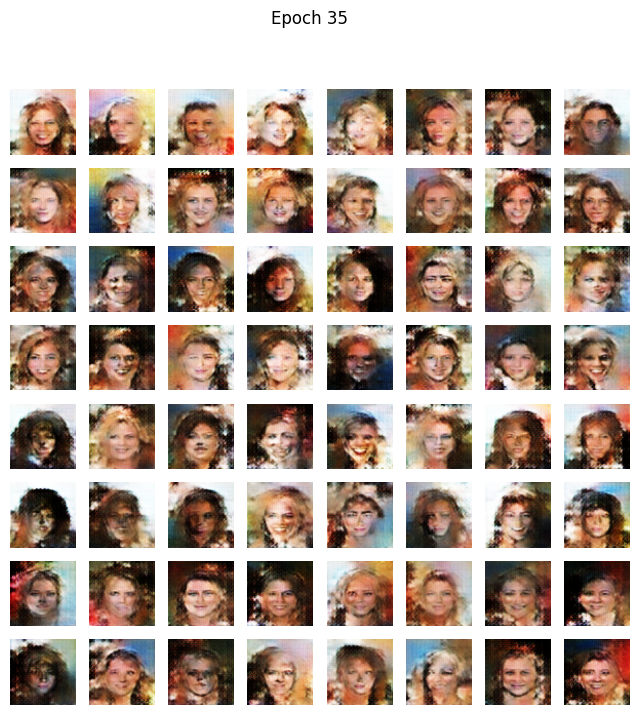

Epoch 36 - Generator Loss: 1.3571, Discriminator Loss: 0.9282
Epoch 37 - Generator Loss: 1.3236, Discriminator Loss: 0.9452
Epoch 38 - Generator Loss: 1.3949, Discriminator Loss: 0.8996
Epoch 39 - Generator Loss: 1.4217, Discriminator Loss: 0.8904
Epoch 40 - Generator Loss: 1.5209, Discriminator Loss: 0.9061


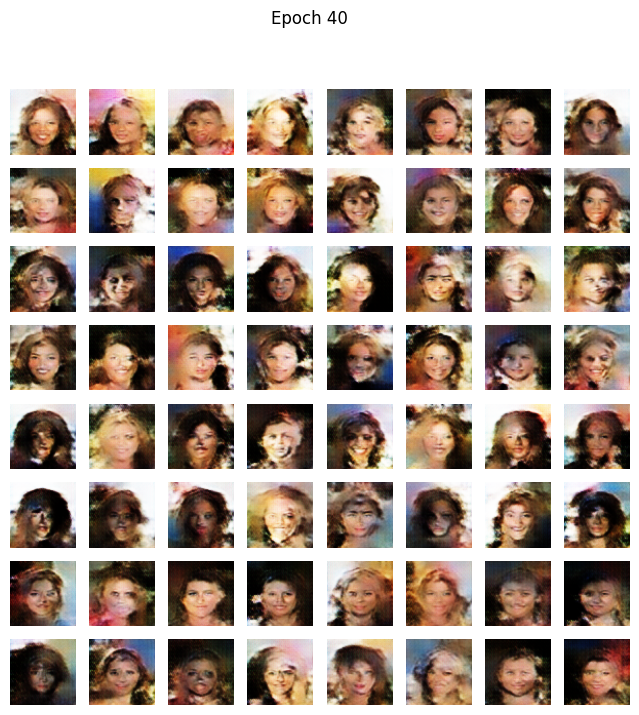

Epoch 41 - Generator Loss: 1.3301, Discriminator Loss: 0.9370
Epoch 42 - Generator Loss: 1.4225, Discriminator Loss: 0.8871
Epoch 43 - Generator Loss: 1.4896, Discriminator Loss: 0.8770
Epoch 44 - Generator Loss: 1.5380, Discriminator Loss: 0.8738
Epoch 45 - Generator Loss: 1.5155, Discriminator Loss: 0.8371


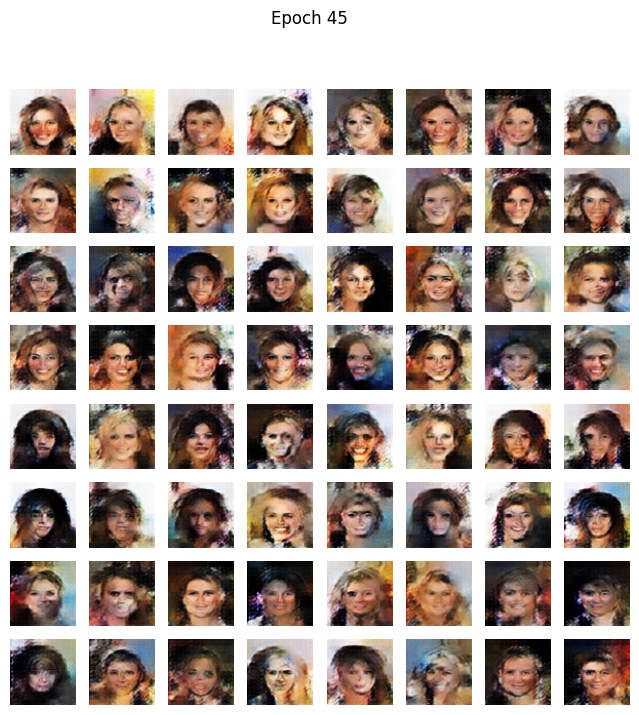

Epoch 46 - Generator Loss: 1.4316, Discriminator Loss: 0.8769
Epoch 47 - Generator Loss: 1.5274, Discriminator Loss: 0.8386
Epoch 48 - Generator Loss: 1.4757, Discriminator Loss: 0.8437
Epoch 49 - Generator Loss: 1.5737, Discriminator Loss: 0.8408
Epoch 50 - Generator Loss: 1.5077, Discriminator Loss: 0.8379


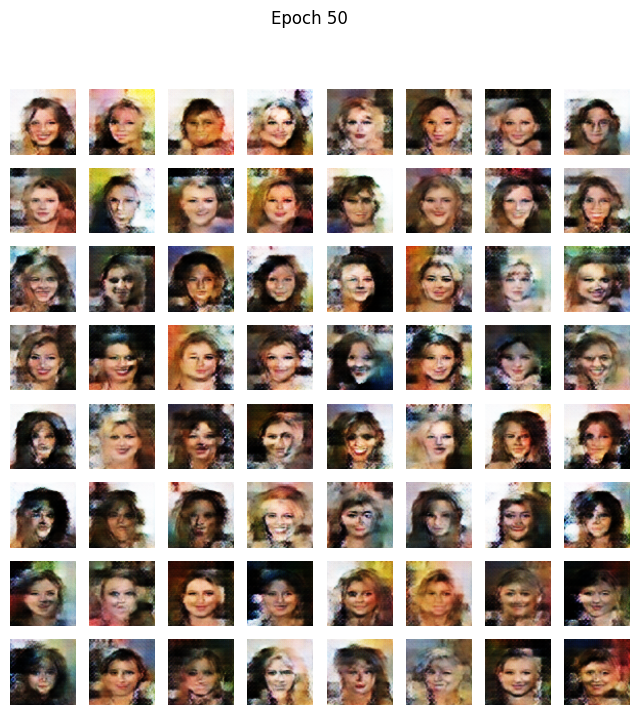

Epoch 51 - Generator Loss: 1.6764, Discriminator Loss: 0.7812
Epoch 52 - Generator Loss: 1.9015, Discriminator Loss: 0.8267
Epoch 53 - Generator Loss: 1.5200, Discriminator Loss: 0.8240
Epoch 54 - Generator Loss: 1.5230, Discriminator Loss: 0.8725
Epoch 55 - Generator Loss: 1.5380, Discriminator Loss: 0.8493


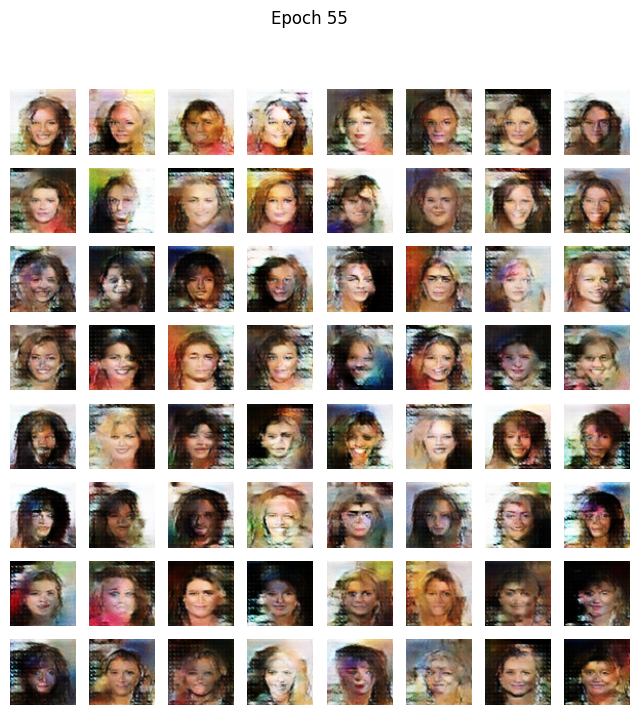

Epoch 56 - Generator Loss: 1.4930, Discriminator Loss: 0.9278
Epoch 57 - Generator Loss: 1.4432, Discriminator Loss: 0.9373
Epoch 58 - Generator Loss: 1.4646, Discriminator Loss: 0.9491
Epoch 59 - Generator Loss: 1.3827, Discriminator Loss: 0.9579
Epoch 60 - Generator Loss: 1.3820, Discriminator Loss: 0.9577


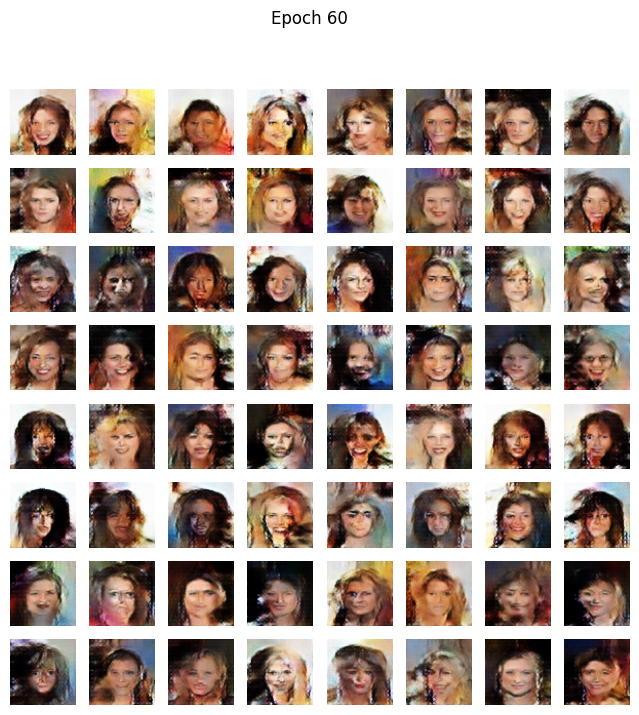

Epoch 61 - Generator Loss: 1.3730, Discriminator Loss: 1.0178
Epoch 62 - Generator Loss: 1.3353, Discriminator Loss: 0.9965
Epoch 63 - Generator Loss: 1.3523, Discriminator Loss: 1.0124
Epoch 64 - Generator Loss: 1.3081, Discriminator Loss: 1.0057
Epoch 65 - Generator Loss: 1.2540, Discriminator Loss: 1.0594


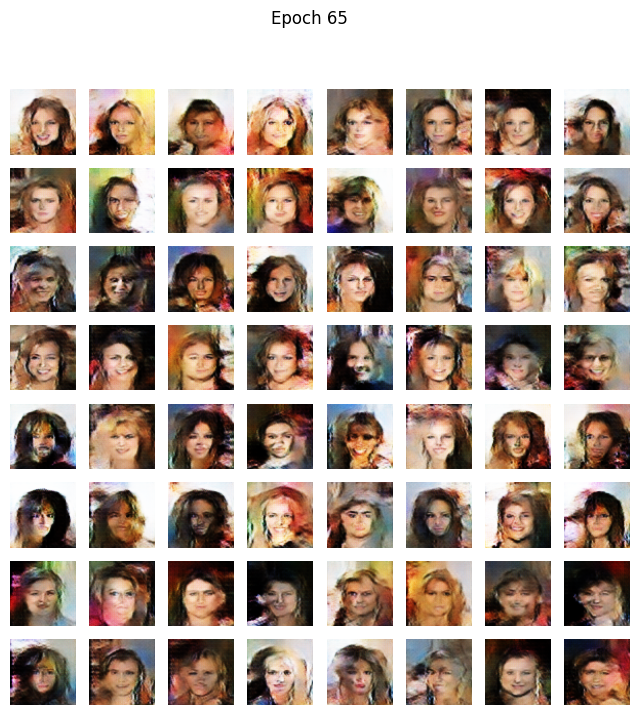

Epoch 66 - Generator Loss: 1.2880, Discriminator Loss: 1.0466
Epoch 67 - Generator Loss: 1.2491, Discriminator Loss: 1.0175
Epoch 68 - Generator Loss: 1.2516, Discriminator Loss: 1.0531
Epoch 69 - Generator Loss: 1.2781, Discriminator Loss: 1.0211
Epoch 70 - Generator Loss: 1.2466, Discriminator Loss: 1.0472


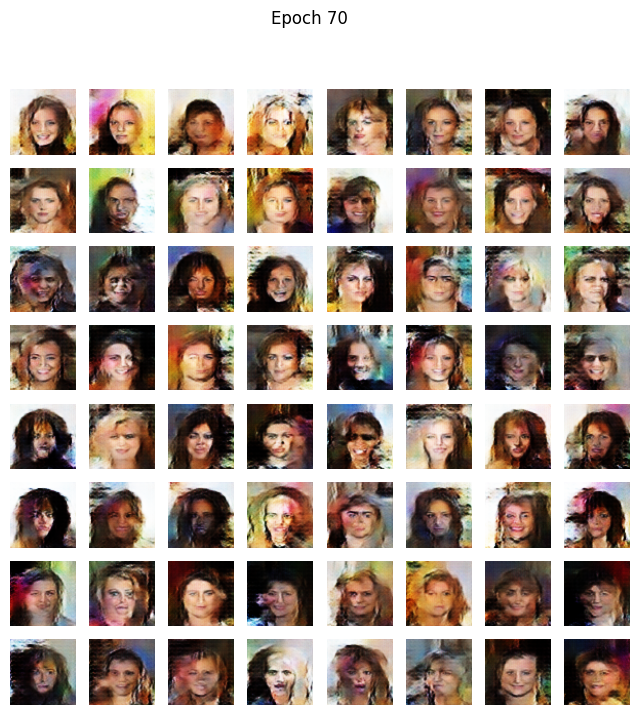

Epoch 71 - Generator Loss: 1.2677, Discriminator Loss: 1.0314
Epoch 72 - Generator Loss: 1.2698, Discriminator Loss: 1.0352
Epoch 73 - Generator Loss: 1.2346, Discriminator Loss: 1.0431
Epoch 74 - Generator Loss: 1.2417, Discriminator Loss: 1.0348
Epoch 75 - Generator Loss: 1.2420, Discriminator Loss: 1.0374


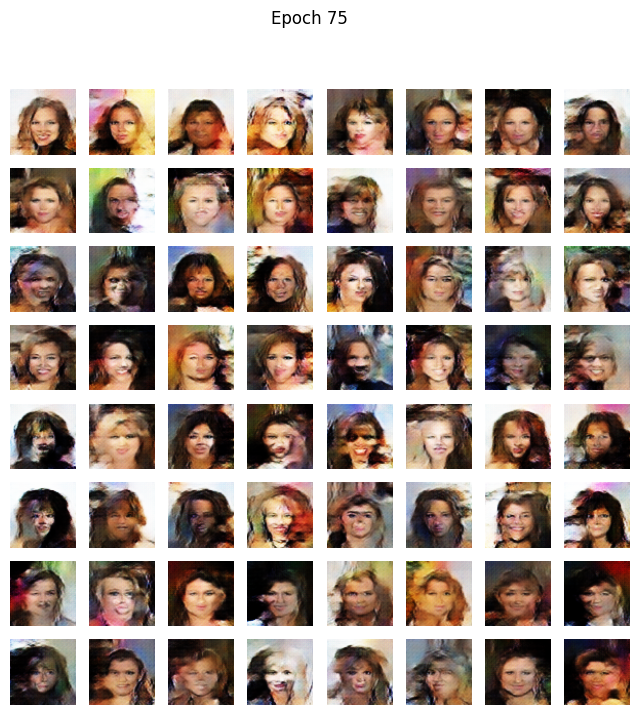

Epoch 76 - Generator Loss: 1.2811, Discriminator Loss: 1.0051
Epoch 77 - Generator Loss: 1.2421, Discriminator Loss: 1.0172
Epoch 78 - Generator Loss: 1.2069, Discriminator Loss: 1.0542
Epoch 79 - Generator Loss: 1.2217, Discriminator Loss: 1.0431
Epoch 80 - Generator Loss: 1.2126, Discriminator Loss: 1.0350


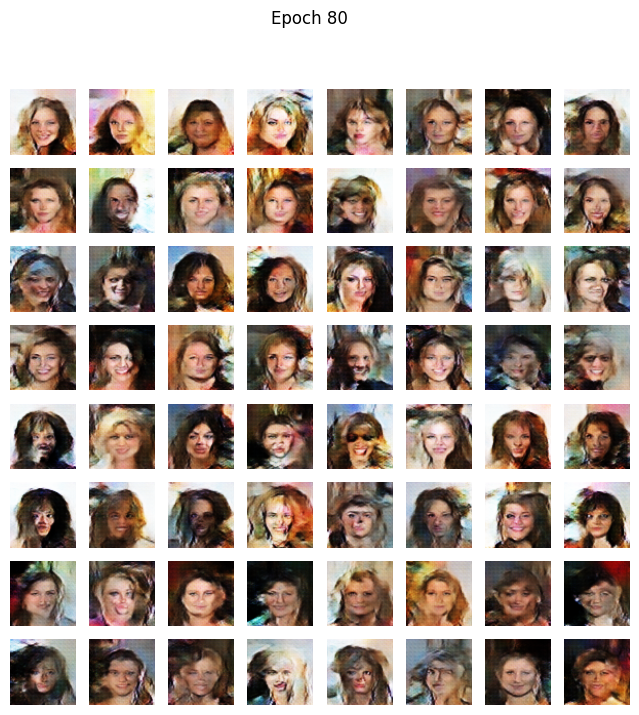

Epoch 81 - Generator Loss: 1.2192, Discriminator Loss: 1.0435
Epoch 82 - Generator Loss: 1.2038, Discriminator Loss: 1.0452
Epoch 83 - Generator Loss: 1.2154, Discriminator Loss: 1.0476
Epoch 84 - Generator Loss: 1.1694, Discriminator Loss: 1.0826
Epoch 85 - Generator Loss: 1.1858, Discriminator Loss: 1.0626


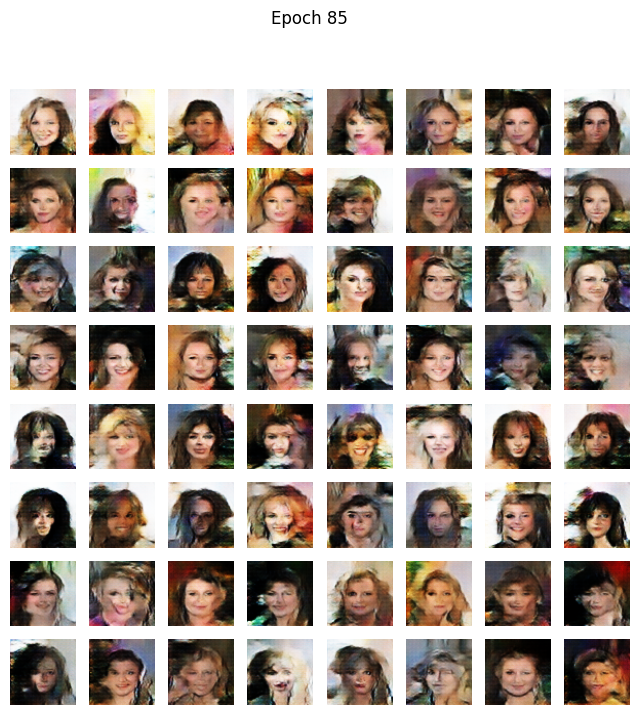

Epoch 86 - Generator Loss: 1.1620, Discriminator Loss: 1.0688
Epoch 87 - Generator Loss: 1.2224, Discriminator Loss: 1.0386
Epoch 88 - Generator Loss: 1.1918, Discriminator Loss: 1.0402
Epoch 89 - Generator Loss: 1.1950, Discriminator Loss: 1.0448
Epoch 90 - Generator Loss: 1.1793, Discriminator Loss: 1.0710


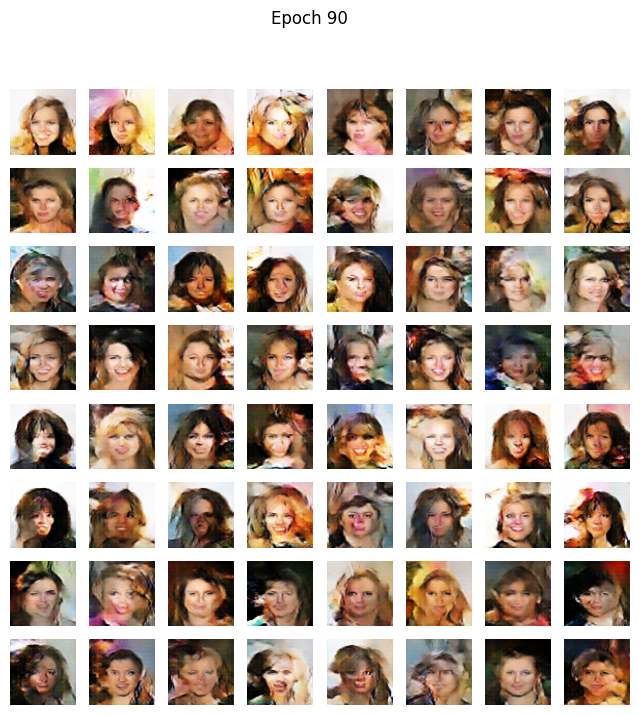

Epoch 91 - Generator Loss: 1.1764, Discriminator Loss: 1.0609
Epoch 92 - Generator Loss: 1.1827, Discriminator Loss: 1.0561
Epoch 93 - Generator Loss: 1.1907, Discriminator Loss: 1.0483
Epoch 94 - Generator Loss: 1.1795, Discriminator Loss: 1.0614
Epoch 95 - Generator Loss: 1.1587, Discriminator Loss: 1.0675


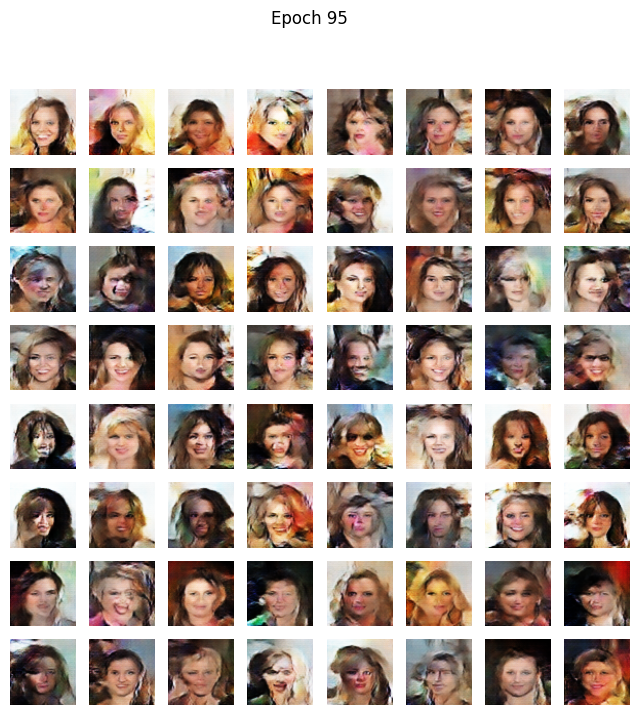

Epoch 96 - Generator Loss: 1.1940, Discriminator Loss: 1.0657
Epoch 97 - Generator Loss: 1.1596, Discriminator Loss: 1.0814
Epoch 98 - Generator Loss: 1.1757, Discriminator Loss: 1.0618
Epoch 99 - Generator Loss: 1.1661, Discriminator Loss: 1.0731
Epoch 100 - Generator Loss: 1.1783, Discriminator Loss: 1.0547


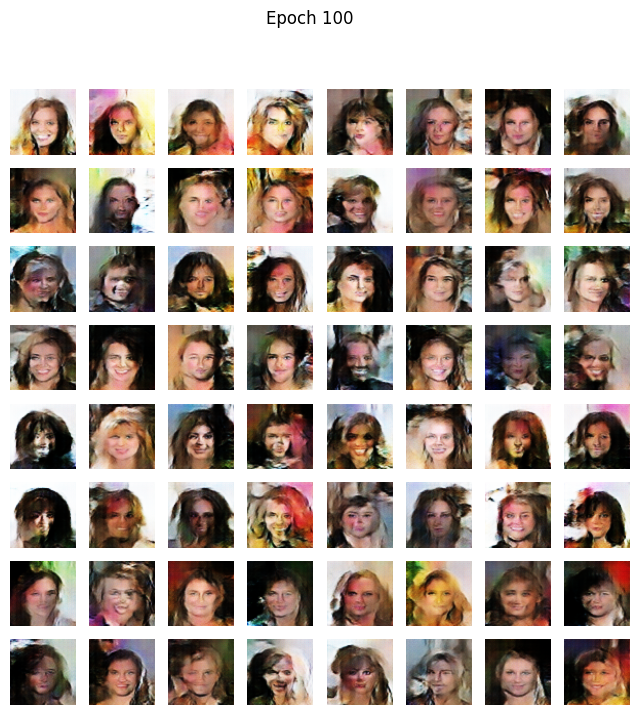

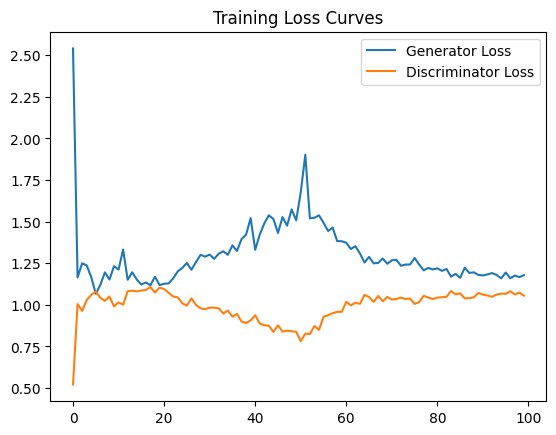

In [8]:

gen_losses, disc_losses = [], []
seed = tf.random.normal([64, LATENT_DIM])
seed_labels = tf.ones((64, 1))  # Generate long hair images

def generate_and_plot_images(model, epoch, save=True):
    predictions = model([seed, seed_labels], training=False)
    predictions = (predictions + 1) / 2.0
    fig = plt.figure(figsize=(8, 8))
    for i in range(predictions.shape[0]):
        plt.subplot(8, 8, i+1)
        plt.imshow(predictions[i])
        plt.axis('off')
    plt.suptitle(f"Epoch {epoch}")
    plt.show()

def train(images, conditions, epochs):
    dataset = tf.data.Dataset.from_tensor_slices((images, conditions)).shuffle(1000).batch(BATCH_SIZE)
    for epoch in range(1, epochs + 1):
        g_loss_epoch, d_loss_epoch = 0, 0
        for img_batch, lbl_batch in dataset:
            g_loss, d_loss = train_step(img_batch, lbl_batch)
            g_loss_epoch += g_loss
            d_loss_epoch += d_loss

        avg_g = g_loss_epoch / len(dataset)
        avg_d = d_loss_epoch / len(dataset)
        gen_losses.append(avg_g)
        disc_losses.append(avg_d)

        print(f"Epoch {epoch} - Generator Loss: {avg_g:.4f}, Discriminator Loss: {avg_d:.4f}")

        if epoch % 5 == 0 or epoch == 1:
          generate_and_plot_images(generator, epoch)

    # Final plot
    plt.plot(gen_losses, label='Generator Loss')
    plt.plot(disc_losses, label='Discriminator Loss')
    plt.legend()
    plt.title('Training Loss Curves')
    plt.show()

train(images, conditions, EPOCHS)
